<a href="https://colab.research.google.com/github/davidalifff/PCVK_Genap_2023/blob/main/UTS.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
import glob
from math import log10, sqrt
import math
import os

#Shape

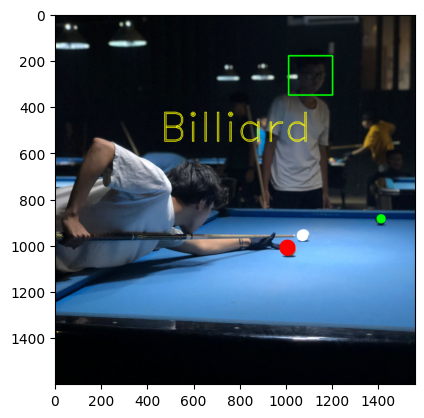

In [ ]:
img_shape = cv.imread('/content/drive/MyDrive/PCVK/UTS/pais.jpeg')
img_rgb = cv.cvtColor(img_shape, cv.COLOR_BGR2RGB)
cv.circle(img_rgb,(1005, 1010), 35, (255,0,0), -1)
cv.circle(img_rgb,(1070,957), 25, (255,255,255), -1)
cv.circle(img_rgb,(1410,885), 20, (0,255,0), -1)
cv.rectangle(img_rgb,pt1=(1010,180),pt2=(1200,350),color=(0,255,0),thickness=5)
font = cv.FONT_HERSHEY_DUPLEX
cv.putText(img_rgb,text="Billiard",org=(450,550),fontFace=font,fontScale=6,color=(255,255,0),thickness=2,lineType=cv.LINE_AA)
plt.imshow(img_rgb)

#Operasi Citra Sederhana

Mengubah tingkat kecerahan citra
--------------------------------
masukkan nilai kecerahan : 40


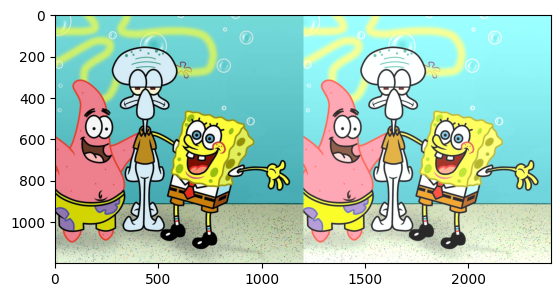

In [ ]:
#Transformasi Linear Brightness

print('Mengubah tingkat kecerahan citra')
print('--------------------------------')
try :
  brightness = int(input('masukkan nilai kecerahan : '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/sp.jpg')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
brightness_image = np.zeros(img_rgb.shape, original.dtype)

#akses per piksel
for y in range(img_rgb.shape[0]):
  for x in range(img_rgb.shape[1]):
    for c in range(img_rgb.shape[2]):
      brightness_image[y,x,c] = np.clip(img_rgb[y,x,c] + brightness, 0, 255)

#cara simple tanpa for loop
#brightness_image = cv.convertScaleAbs(original, beta=brightness)

final_frame = cv.hconcat((img_rgb, brightness_image))
plt.imshow(final_frame)

#Gamma Correction

 Gamma Correction pada citra 
-------------------------------
Masukkan nilai Gamma: 6


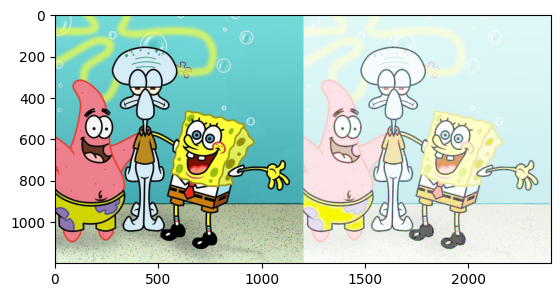

In [ ]:
# Mengubah Gamma Correction
print(' Gamma Correction pada citra ')
print('-------------------------------')
# fungsi try except digunakan untuk autentikasi bahwa yg dimasukkan harus angka, tdk boleh string
try: 
 gamma = int(input('Masukkan nilai Gamma: '))
except ValueError:
 print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/sp.jpg')
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
gamma_image = np.zeros(img_rgb.shape, img_rgb.dtype)

# for y adalah lebar
for y in range(img_rgb.shape[0]):
  # for x adalah tinggi
  for x in range(img_rgb.shape[1]):
    # for c adalah chanel warna
    for c in range(img_rgb.shape[2]):
      gamma_image[y,x,c] = np.clip(255 * pow  (img_rgb[y,x,c] / 255, (1 / gamma)), 0, 255)

final_frame = cv.hconcat((img_rgb, gamma_image))
plt.imshow(final_frame)

#Image Depth

 Simulasi Image Depth  
--------------------------
Masukkan nilai Bit Depth: 2


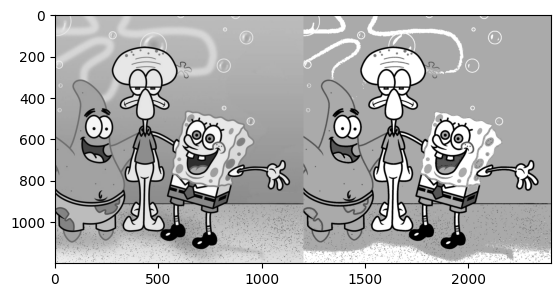

In [ ]:
# Membuat simulasi image Depth
print(' Simulasi Image Depth  ')
print('--------------------------')
try:
  bd = float(input('Masukkan nilai Bit Depth: '))
except ValueError:
  print('Error, not a number')

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/sp.jpg', cv.IMREAD_GRAYSCALE)
img_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
gamma_image = np.zeros(img_rgb.shape, original.dtype)

bit = 2**bd
level = 255 / (bit - 1)

for y in range(img_rgb.shape[0]):
  for x in range(img_rgb.shape[1]):
     gamma_image[y,x] = np.clip(round(original[y,x] / level) * level, 0, 255);

final_frame = cv.hconcat((img_rgb, gamma_image))
plt.imshow(final_frame)

#PSNR

Nilai PSNR adalah None (dB)


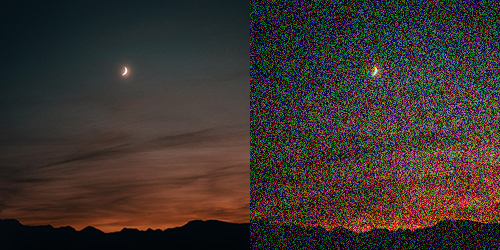

In [ ]:
# Membuat Average Denoising

import glob
from math import log10, sqrt

original = cv.imread('/content/drive/MyDrive/PCVK/UTS/ori.jpg')
cv_img = []
for img in glob.glob('/content/drive/MyDrive/PCVK/UTS/noises/*.jpg'):
    n = cv.imread(img)
    cv_img.append(n)

dst = cv_img[0]
noise_number = 4 
for i in range(noise_number):
    if i == 0:
        pass
    else:
        alpha = 1.0 / (i + 1)
        beta = 1.0 - alpha
        dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed): 
  mse = np.mean((original - compressed)**2) 
  if(mse == 0):  
    return 100
    max_pixel = 255.0
    psnr = 20 * log10(max_pixel / sqrt(mse)) 
    return psnr

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah',psnr,'(dB)')
galaxy_frame = cv.hconcat((original, dst))
cv2_imshow(galaxy_frame)

Nilai PSNR adalah None (dB)


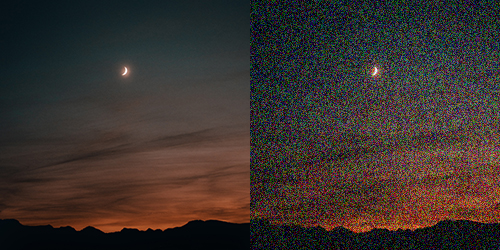

In [ ]:
dst = cv_img[0]
noise_number = 10 # jumlah citra array yang di average
for i in range(noise_number):
  if i == 0: pass
  else : 
    alpha = 1.0 / (i + 1)
    beta = 1.0 - alpha
    dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah', psnr,'(dB)')
galaxy_frame = cv.hconcat((original,dst))
cv2_imshow(galaxy_frame)
     

Nilai PSNR adalah None (dB)


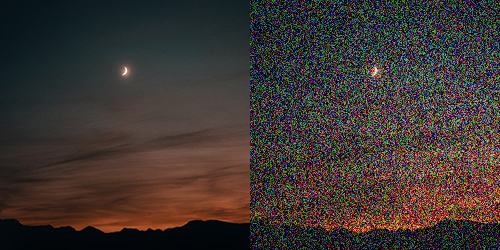

In [ ]:
dst = cv_img[0]
noise_number = 1 # jumlah citra array yang di average
for i in range(noise_number):
  if i == 0: pass
  else : 
    alpha = 1.0 / (i + 1)
    beta = 1.0 - alpha
    dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

compressed = dst
psnr = PSNR(original, compressed)

print('Nilai PSNR adalah', psnr,'(dB)')
galaxy_frame = cv.hconcat((original,dst))
cv2_imshow(galaxy_frame)

#Image Masking

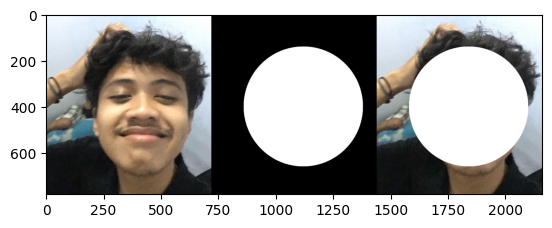

In [ ]:

# Operator OR

img_rai = cv.imread('/content/drive/MyDrive/PCVK/UTS/pais2.jpeg')
img_face = cv.cvtColor(img_rai, cv.COLOR_BGR2RGB)
mask = np.zeros(img_face.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 400), 260, (255,255,255), -1)

masked = img_face | mask

face_frame = cv.hconcat((img_face, mask, masked))
plt.imshow(face_frame)

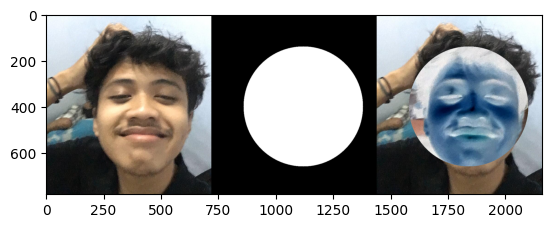

In [ ]:
#Operator XOR

mask = np.zeros(img_face.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 400), 260, (255,255,255), -1)

masked = img_face ^ mask

face_frame = cv.hconcat((img_face, mask, masked))
plt.imshow(face_frame)

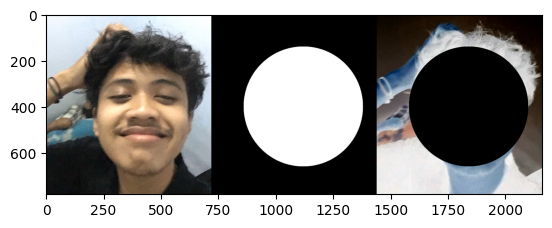

In [ ]:
#Operator Not
mask = np.zeros(img_face.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 400), 260, (255,255,255), -1)

masked = ~img_face & ~mask

face_frame = cv.hconcat((img_face, mask, masked))
plt.imshow(face_frame)

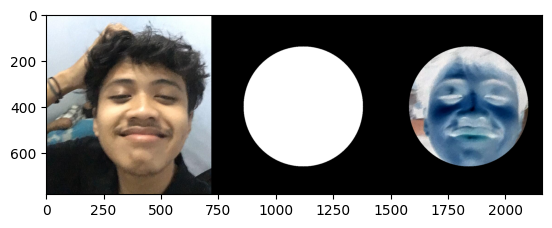

In [ ]:
#Operator NAND
mask = np.zeros(img_face.shape, dtype=np.uint8)
mask = cv.circle(mask, (400, 400), 260, (255,255,255), -1)

masked = ~img_face & mask

face_frame = cv.hconcat((img_face, mask, masked))
plt.imshow(face_frame)

#Histogram

<BarContainer object of 256 artists>

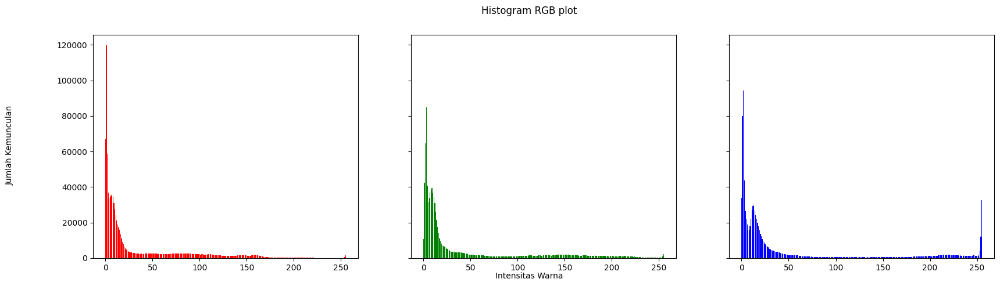

In [ ]:
image = cv.imread('/content/drive/MyDrive/PCVK/UTS/dvd1.jpg')
height, width, depth = np.shape(image)
names = np.arange(256)

blue = [0]*256
green = [0]*256
red = [0]*256

for y in range(0,height):
  for x in range(0,width):
    blue[image[y][x][0]] += 1
    green[image[y][x][1]] += 1
    red[image[y][x][2]] += 1

names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=[20,5], sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.05, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')

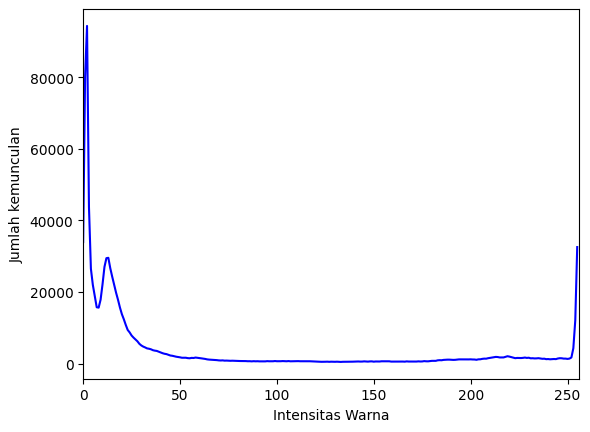

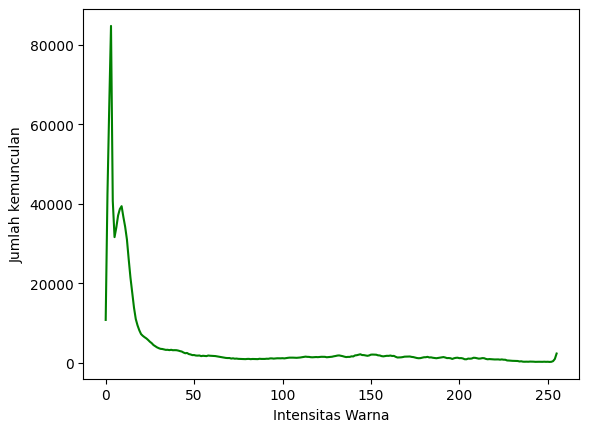

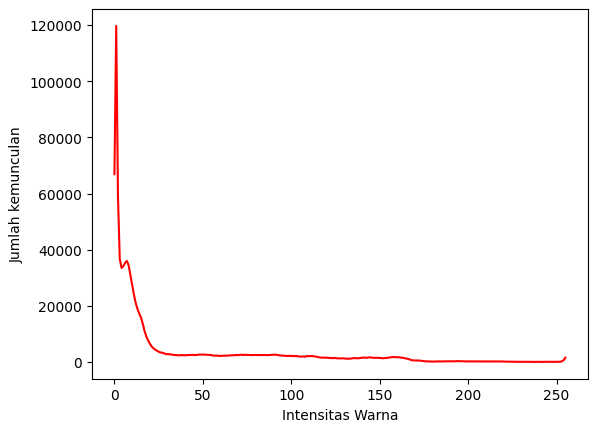

In [ ]:
colors = ("b","g","r")
channel_ids = (0, 1, 2)

plt.xlim([0, 256])
for channel_id, c in zip(channel_ids, colors):
  histogram, bin_edges = np.histogram(
      image[:, :, channel_id], bins=256, range =(0,256)
  )
  plt.plot(bin_edges[0:-1], histogram, color=c)

  plt.xlabel("Intensitas Warna")
  plt.ylabel("Jumlah kemunculan")

  plt.show()

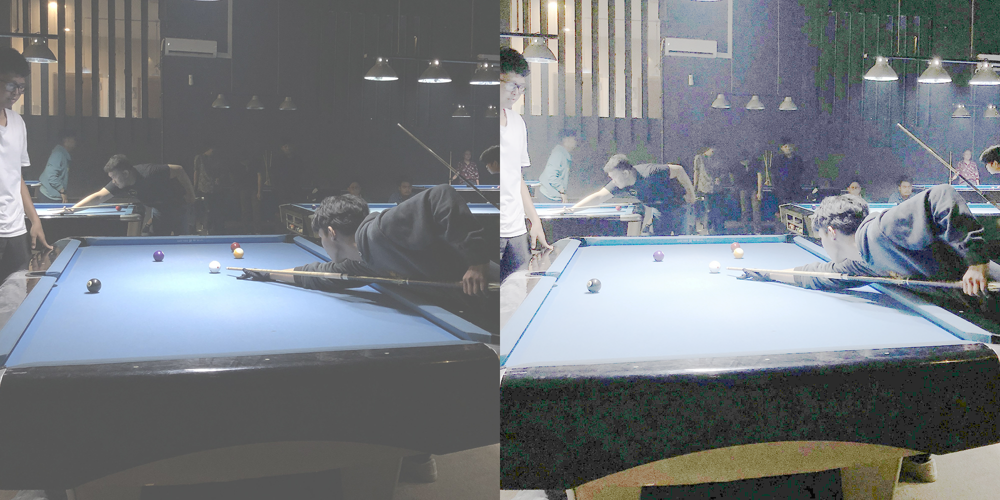

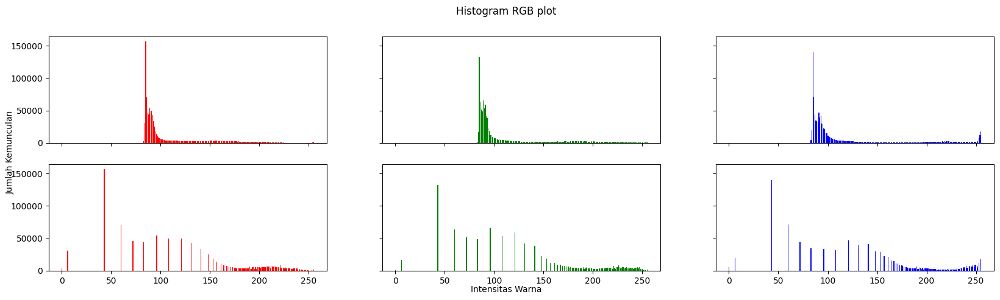

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/dvd_gg1.jpg')
def histog(img):
  height, width, depth = np.shape(img) 
  ax = np.zeros((3,256)) 
  for y in range(0,height) : 
    for x in range(0,width) :
      ax[0][img[y][x][0]] += 1 
      ax[1][img[y][x][1]] += 1
      ax[2][img[y][x][2]] += 1 
  return ax

histo_asli = histog(img)

img_array = np.asarray(img)

histogram_array = np.bincount(img_array.flatten(), minlength=256)

num_pixels = np. sum(histogram_array) 
histogram_array = histogram_array/num_pixels

chistogram_array = np.cumsum(histogram_array)

transform_map = np.floor(255 * chistogram_array). astype (np.uint8)

img_list = list(img_array.flatten())

eq_img_list = [transform_map[p] for p in img_list]

eq_img_array = np.reshape(np.asarray(eq_img_list), img_array.shape) 
img2 = eq_img_array

equal_histo = histog(img2)

final_frame = cv.hconcat((img, img2))
cv2_imshow(final_frame)

names = np.arange (256) 
isgrayimg = np.array_equal(blue, green, red) 
if (isgrayimg == False):
  fig, axs = plt.subplots(2, 3, figsize=[20,5], sharex=True, sharey=True) 
  fig.suptitle('Histogram RGB plot') 
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical') 
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center') 
  axs[0,0].bar(names, histo_asli[2], color='red') 
  axs[0,1].bar(names, histo_asli[1], color='green') 
  axs[0,2].bar(names, histo_asli[0], color='blue') 
  axs[1,0].bar(names, equal_histo[2], color='red') 
  axs[1,1].bar(names, equal_histo[1], color='green')
  axs[1,2].bar(names, equal_histo[0], color='blue') 
else:
  fig, axs = plt. subplots(1, 2, figsize=[20,5], sharex=Trbe, sharey=True) 
  fig. suptitle('Histogram RGB plot') 
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical') 
  fig.text(0.5, 0.94, 'Intensitas Warna', ha='center') 
  axs[0,0].bar(names, histo_asli[2], color='gray') 
  axs[0,1].bar(names, equal_histo[2], color='gray')

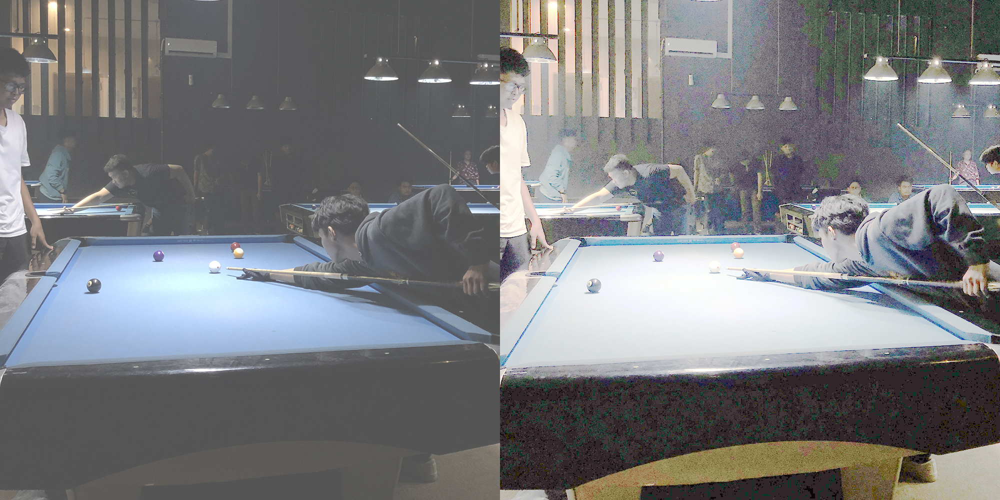

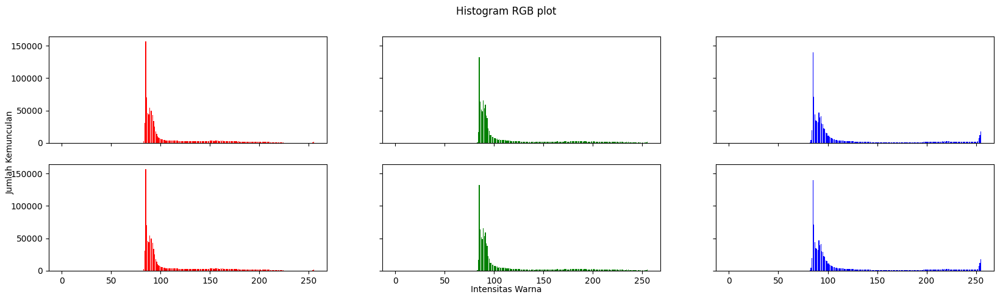

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/UTS/dvd_gg1.jpg')
channels = cv.split(img)
eq_channels = []
for ch, color in zip(channels, ['R', 'G', 'B']):
  eq_channels.append(cv.equalizeHist(ch))
eq_image = cv.merge(eq_channels)
equal_histo = histog(eq_image)

final_frame = cv.hconcat((img, eq_image))
cv2_imshow(final_frame)

names = np.arange(256)
isgraying = np.array_equal(blue, green, red)
if (isgraying == False):
  fig, axs = plt.subplots(2, 3, figsize=[20,5], sharex=True, sharey =True)
  fig.suptitle('Histogram RGB plot')
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
  axs[0,0].bar(names, histo_asli[2], color='red')
  axs[0,1].bar(names, histo_asli[1], color='green')
  axs[0,2].bar(names, histo_asli[0], color='blue')
  axs[1,0].bar(names, histo_asli[2], color='red')
  axs[1,1].bar(names, histo_asli[1], color='green')
  axs[1,2].bar(names, histo_asli[0], color='blue')
else:
  fig, axs = plt.subplots(1, 2, figsize=[20,5], sharex=True, sharey=True)
  fig.suptitle('Histogram RGB plot')
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
  axs[0,0].bar(names, histo_asli[2], color='gray')
  axs[0,1].bar(names, equal_histo[2], color='gray')

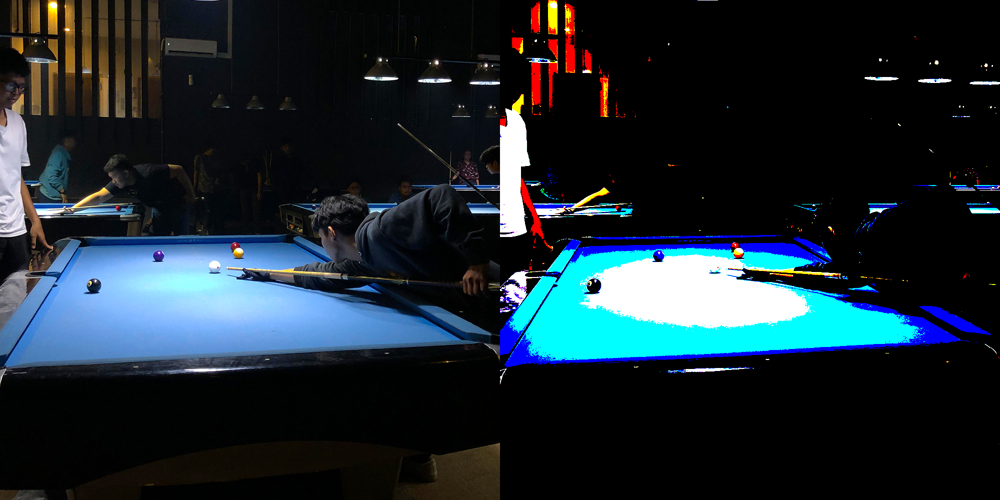

In [ ]:
david_original = cv.imread('/content/drive/MyDrive/PCVK/UTS/dvd1.jpg')

def warnaTerdekat (r, g, b):
  pValue = 0
  minDistance = 255*255 + 255*255 + 255*255 + 1
  warnaPallette = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [255, 255, 0], [0, 0, 255], [255, 0, 255], [0, 255, 255], [255, 255, 255]]
  for i in range(len(warnaPallette)):
    rDiff = r - warnaPallette[i][0]
    gDiff = g - warnaPallette[i][1]
    bDiff = b - warnaPallette[i][2]
    distance = rDiff*rDiff + gDiff*gDiff + bDiff*bDiff
    if (distance < minDistance):
      minDistance = distance
      pValue = i
  return pValue

warnaPallette = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [255, 255, 0], [0, 0, 255], [255, 0, 255], [0, 255, 255], [255, 255, 255]]
img_16jt = cv.cvtColor(david_original, cv.COLOR_BGR2RGB)
img_8 = np.zeros(img_16jt.shape, img_16jt.dtype)

for y in range(0, img_16jt.shape[0]):
  for x in range(0, img_16jt.shape[1]):
    baru = warnaTerdekat(img_16jt[y, x, 0], img_16jt[y, x, 1], img_16jt[y, x, 2])
    img_8[y, x] = warnaPallette[baru]
    
img_16jt = cv.cvtColor(img_16jt, cv.COLOR_BGR2RGB)
img_8 = cv.cvtColor(img_8, cv.COLOR_BGR2RGB)
final_frame = cv.hconcat((img_16jt, img_8))
cv2_imshow(final_frame)

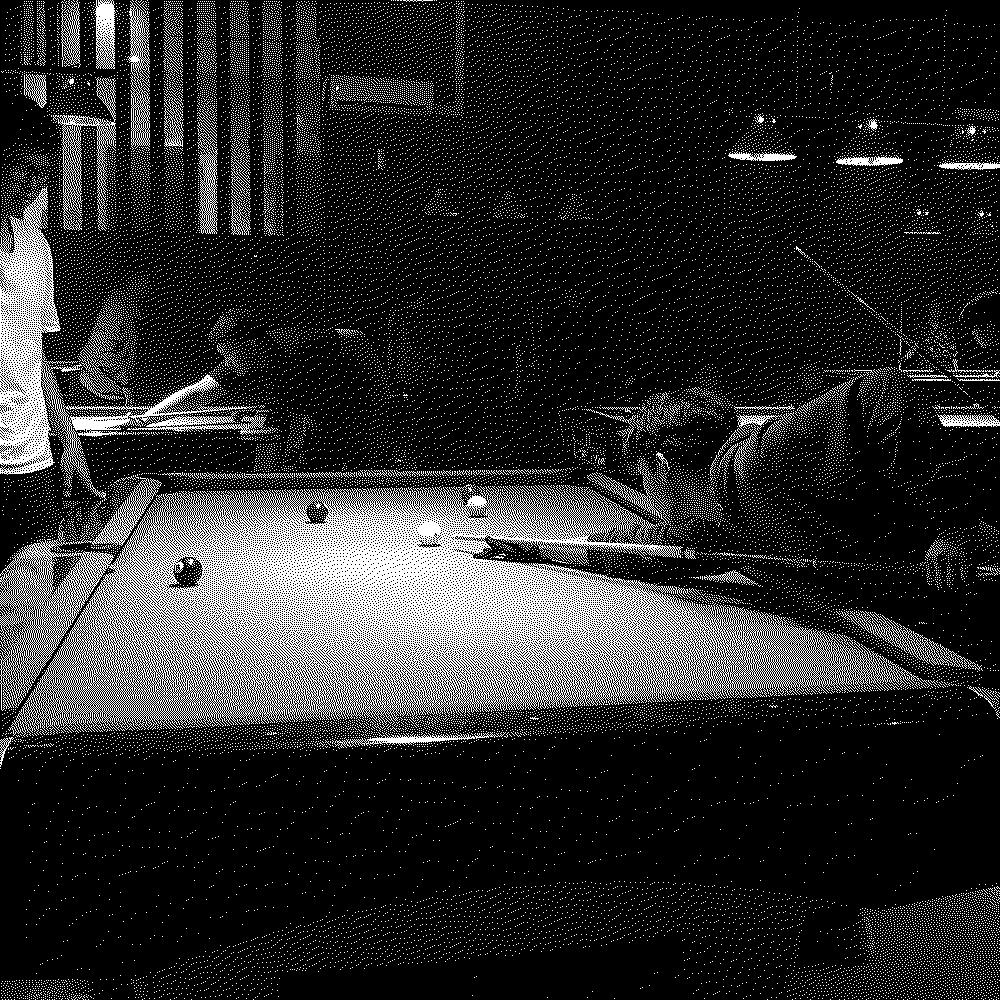

In [ ]:
from PIL import Image
import cv2
import numpy as np

imageConvert = Image.open('/content/drive/MyDrive/PCVK/UTS/dvd_gg.jpg').convert(mode='1',dither=Image.FLOYDSTEINBERG)
imageConvert.save('/content/drive/MyDrive/PCVK/UTS/dvd_gg.jpg')


Image = cv2.imread('/content/drive/MyDrive/PCVK/UTS/dvd_gg.jpg')

GrayImage = cv2.cvtColor(Image, cv2.COLOR_BGR2GRAY)
cv2.imwrite('/content/drive/MyDrive/PCVK/UTS/dvd_gg.jpg', GrayImage)

Height = GrayImage.shape[0]
Width = GrayImage.shape[1]

for y in range(0, Height):
    for x in range(0, Width):

        old_value = GrayImage[y, x]
        new_value = 0
        if (old_value > 128) :
            new_value = 255

        GrayImage[y, x] = new_value

        Error = old_value - new_value
        x=255
        y=255

        if(x) : NewNumber=255
        elif (NewNumber<0):NewNumber =0
        GrayImage[y,x+1] = NewNumber

        if(x>0 and y) : NewNumber=255
        elif (NewNumber<0):NewNumber =0
        GrayImage[y+1,x-1] = NewNumber

        if(y) : NewNumber=255
        elif (NewNumber<0):NewNumber =0
        GrayImage[y+1,x] = NewNumber

        if(y) : NewNumber=255
        elif (NewNumber<0):NewNumber =0
        GrayImage[y+1,x+1] = NewNumber

cv2.imwrite('/content/drive/MyDrive/PCVK/UTS/dvd_gg.jpg', GrayImage)
cv2_imshow(GrayImage)

In [ ]:
original = cv.imread('/content/drive/MyDrive/PCVK/UTS/.jpg')

cv_img = [] 
for img in glob.glob('/content/drive/MyDrive/PCVK/UTS/noises/*.jpg'): 
  n= cv.imread(img) 
  cv_img.append(n)

dst = cv_img[0]
noise_number = 5

for i in range(noise_number):
    if i == 0 :
      pass
    else:
      alpha = 1.0 / (i + 1)
      beta = 1.0 - alpha
      dst = cv.addWeighted(cv_img[i], alpha, dst, beta, 0.0)

def PSNR(original, compressed):
    mse = np.mean((original-compressed) ** 2)
    if(mse == 0):
      return 100
    max_pixel = 255.0
    psnr = 20* log10(max_pixel / sqrt(mse))
    return psnr

compressed = dst
psnr = PSNR(original, compressed)
mse = np.mean((original - compressed) ** 2)

print('Nilai MSE adalah', mse)
print('Nilai PSNR adalah ', psnr, '(dB)')
noice_frame = cv.hconcat((original, dst))
cv2_imshow(noice_frame)